In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
sb.set() # set the default Seaborn style for graphics

!pip install --upgrade category_encoders
# Encoding
import category_encoders as ce

# Upscaling
from sklearn.utils import resample

# Machine learning
from sklearn.model_selection import train_test_split as split
from sklearn.model_selection import KFold,StratifiedKFold
from sklearn.tree import plot_tree
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelBinarizer, LabelEncoder
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

In [2]:
# Getting Datasets
merged_df = pd.read_csv("ml_dataset.csv")

## Machine Learning

In this section, we will be preparing the datasets for machine learning by firstly encoding the categorical variables using target encoder. This ensures that the categorical variables are transformed into numerical representation to be used by the machine learning algorithms. In addition, we also did upscaling to balance our dataset in order to achieve better accuracy. 

For machine learning, we have used two models: Decision Tree and Random Forest coupled with GridSearchCV. There are two versions for the Decision Tree, version 1 using the dataset without upscaling and version 2 which uses the dataset with upscaling. Similarly, for Random Forest there are also 2 versions. Random Forest was performed a third time after the use of GridSearchCV for optimal performance.

### Encoding

In [4]:
# Use target encoder to encode the non-numerical columns
# Define the target encoder with smoothing to avoid overfitting
encoder = ce.TargetEncoder(cols=["NAME_INCOME_TYPE", "NAME_EDUCATION_TYPE", "NAME_FAMILY_STATUS", "NAME_HOUSING_TYPE", "OCCUPATION_TYPE","CODE_GENDER"], smoothing=0.2)
print("Converted non-numerical columns to numerical columns using target encoder with smoothing")

# Fit and transform the encoder on the data
merged_df = encoder.fit_transform(merged_df, merged_df["STATUS"])

# Show number of numerical and non-numerical columns in the dataframe
print("\n[POST CONVERSION]\n Number of numerical columns: {}".format(merged_df.select_dtypes(include=np.number).shape[1]))
print("\n[POST CONVERSION]\n Number of non-numerical columns: {}".format(merged_df.select_dtypes(exclude=np.number).shape[1]))

Converted non-numerical columns to numerical columns using target encoder with smoothing

[POST CONVERSION]
 Number of numerical columns: 14

[POST CONVERSION]
 Number of non-numerical columns: 1


In [5]:
# Show the number of unique values in each column
print("[UNIQUE VALUES PER COLUMN]\n")
merged_df.nunique()

[UNIQUE VALUES PER COLUMN]



Unnamed: 0.1           36457
Unnamed: 0             36457
ID                     36457
STATUS                     2
CODE_GENDER                2
CNT_CHILDREN               9
AMT_INCOME_TOTAL         265
NAME_INCOME_TYPE           5
NAME_EDUCATION_TYPE        5
NAME_FAMILY_STATUS         5
NAME_HOUSING_TYPE          6
DAYS_EMPLOYED              2
OCCUPATION_TYPE           19
CNT_FAM_MEMBERS           10
Income Range               6
dtype: int64

### Upscaling

In [6]:
# Upsample Bad to match Good
creditBad = merged_df[merged_df.STATUS == 1]
creditGood = merged_df[merged_df.STATUS == 0]
 
# Upsample the good samples
creditgood_up = resample(creditGood, 
                        replace=True,                     # sample with replacement
                        n_samples=creditBad.shape[0])    # to match number of Good
 
# Combine the two classes back after upsampling
scaled_df = pd.concat([creditBad, creditgood_up])
 
# Check the ratio of the classes
scaled_df['STATUS'].value_counts()

1.0    32002
0.0    32002
Name: STATUS, dtype: int64

### Decision Tree

#### Version 1: Without Upscaling

In [7]:
store = ['AMT_INCOME_TOTAL','CNT_FAM_MEMBERS','NAME_EDUCATION_TYPE','OCCUPATION_TYPE']
X = pd.DataFrame(merged_df[store]) 
y = pd.DataFrame(merged_df['STATUS']) 

kfold = StratifiedKFold(n_splits=8, shuffle=True, random_state=0)

X_train, X_test, y_train, y_test = split(X, y, test_size=0.3)

dectree = DecisionTreeClassifier(max_depth=8,splitter='best',random_state=42)
dectree.fit(X_train, y_train)

# Plot the trained Decision Tree
f = plt.figure(figsize=(100, 20), dpi=300)
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=X_train.columns, 
          class_names=["Bad","Good"])
plt.show()

Train Data
Accuracy  :	 0.5653826560601904

TPR Train :	 0.9983493932905068
TNR Train :	 0.0235256203673864

FPR Train :	 0.9764743796326136
FNR Train :	 0.0016506067094932192


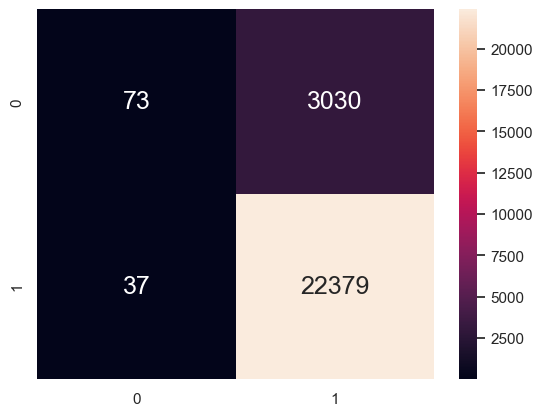

              precision    recall  f1-score   support

         0.0       0.66      0.02      0.05      3103
         1.0       0.88      1.00      0.94     22416

    accuracy                           0.88     25519
   macro avg       0.77      0.51      0.49     25519
weighted avg       0.85      0.88      0.83     25519



In [12]:
# Print the Classification Accuracy
print("Train Data")
print("Accuracy  :\t", dectree.score(X_train, y_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y_train,y_pred_train)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_pred_train), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for train data and predictions
print(classification_report(y_train, y_pred_train))

Test Data
Accuracy  :	 0.5751508502468459

TPR Test :	 0.996244523263092
TNR Test :	 0.022189349112426034

FPR Test :	 0.977810650887574
FNR Test :	 0.003755476736907991


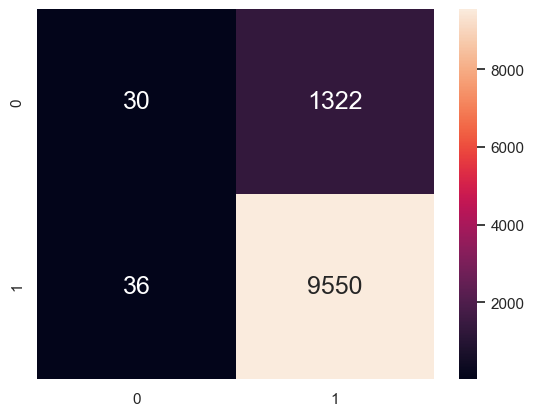

              precision    recall  f1-score   support

         0.0       0.45      0.02      0.04      1352
         1.0       0.88      1.00      0.93      9586

    accuracy                           0.88     10938
   macro avg       0.67      0.51      0.49     10938
weighted avg       0.83      0.88      0.82     10938



In [13]:
# Print the Classification Accuracy
print("Test Data")
print("Accuracy  :\t", dectree.score(X_test, y_test))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTest = confusion_matrix(y_test,y_pred)
tpTest = cmTest[1][1] # True Positives : Good (1) predicted Good (1)
fpTest = cmTest[0][1] # False Positives : Bad (0) predicted Good (1)
tnTest = cmTest[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTest = cmTest[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Test :\t", (tpTest/(tpTest + fnTest)))
print("TNR Test :\t", (tnTest/(tnTest + fpTest)))
print()

print("FPR Test :\t", (fpTest/(tnTest + fpTest)))
print("FNR Test :\t", (fnTest/(tpTest + fnTest)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for test data and predictions
print(classification_report(y_test, y_pred))

#### Version 2: With Upscaling

In [14]:
# Extract Response and Predictors
store = ['AMT_INCOME_TOTAL','CNT_FAM_MEMBERS','NAME_EDUCATION_TYPE','OCCUPATION_TYPE']
X1 = pd.DataFrame(scaled_df[store]) 
y1 = pd.DataFrame(scaled_df['STATUS']) 

# Split the Dataset into Train and Test
X1_train, X1_test, y1_train, y1_test = split(X1, y1, test_size = 0.3)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 8)  # change max_depth to experiment
dectree.fit(X1_train, y1_train)                    # train the decision tree model

# Plot the trained Decision Tree
f = plt.figure(figsize=(100, 20), dpi=300)
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=X1_train.columns, 
          class_names=["Bad","Good"])
plt.show()

Train Data
Accuracy  :	 0.5607562162403464

TPR Train :	 0.4701927785940074
TNR Train :	 0.6518060964146636

FPR Train :	 0.34819390358533636
FNR Train :	 0.5298072214059926


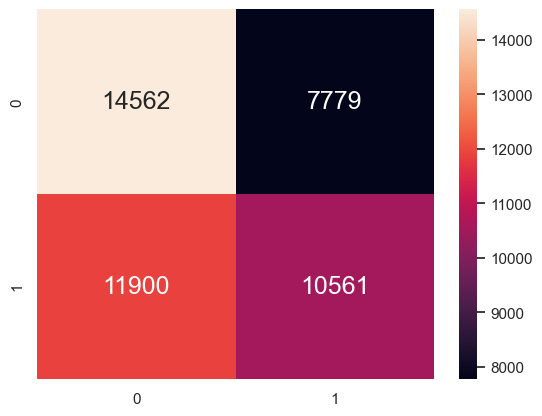

              precision    recall  f1-score   support

         0.0       0.55      0.65      0.60     22341
         1.0       0.58      0.47      0.52     22461

    accuracy                           0.56     44802
   macro avg       0.56      0.56      0.56     44802
weighted avg       0.56      0.56      0.56     44802



In [15]:
# Predict the Response corresponding to Predictors
y1_train_pred = dectree.predict(X1_train)

# Print the Classification Accuracy
print("Train Data")
print("Accuracy  :\t", dectree.score(X1_train, y1_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y1_train, y1_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y1_train, y1_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for train data and predictions
print(classification_report(y1_train, y1_train_pred))

Test Data
Accuracy  :	 0.5592646599312572

TPR Test :	 0.4683995388324075
TNR Test :	 0.6490011385984887

FPR Test :	 0.3509988614015112
FNR Test :	 0.5316004611675925


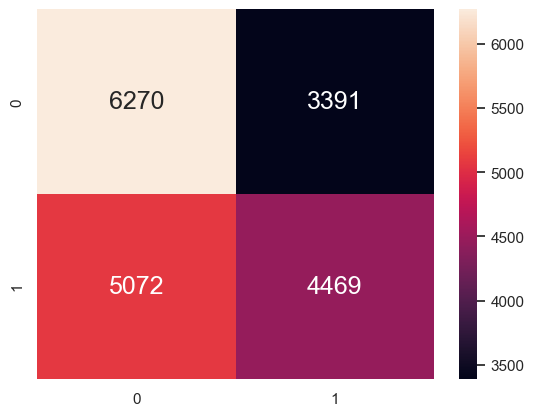

              precision    recall  f1-score   support

         0.0       0.55      0.65      0.60      9661
         1.0       0.57      0.47      0.51      9541

    accuracy                           0.56     19202
   macro avg       0.56      0.56      0.56     19202
weighted avg       0.56      0.56      0.56     19202



In [16]:
# Print the Classification Accuracy
print("Test Data")
print("Accuracy  :\t", dectree.score(X1_test, y1_test))
print()

# Predict the Response corresponding to Predictors
y1_pred = dectree.predict(X1_test)

# Print the Accuracy Measures from the Confusion Matrix
cmTest = confusion_matrix(y1_test,y1_pred)
tpTest = cmTest[1][1] # True Positives : Good (1) predicted Good (1)
fpTest = cmTest[0][1] # False Positives : Bad (0) predicted Good (1)
tnTest = cmTest[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTest = cmTest[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Test :\t", (tpTest/(tpTest + fnTest)))
print("TNR Test :\t", (tnTest/(tnTest + fpTest)))
print()

print("FPR Test :\t", (fpTest/(tnTest + fpTest)))
print("FNR Test :\t", (fnTest/(tpTest + fnTest)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y1_test, y1_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for test data and predictions
print(classification_report(y1_test, y1_pred))

### Random Forest

#### Version 1: Without Upscaling

In [17]:
# Create the Random Forest object
rforest = RandomForestClassifier(n_estimators = 100,  # n_estimators denote number of trees
                                 max_depth = None)       # set the maximum depth of each tree

# Fit Random Forest on Train Data
rforest.fit(X_train, y_train.STATUS.ravel())

RandomForestClassifier()

Train Data
Accuracy  :	 0.8896900348759748

TPR Train :	 0.9902748037116346
TNR Train :	 0.16306799871092492

FPR Train :	 0.8369320012890751
FNR Train :	 0.009725196288365453


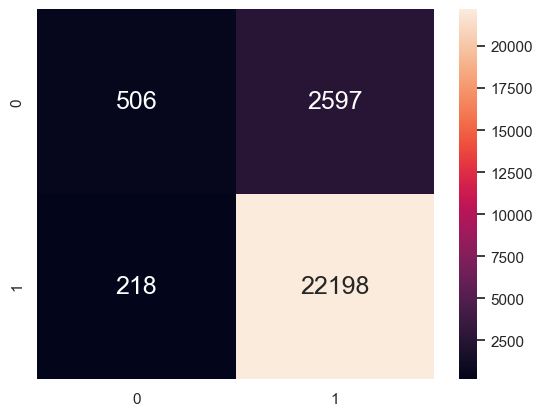

              precision    recall  f1-score   support

         0.0       0.70      0.16      0.26      3103
         1.0       0.90      0.99      0.94     22416

    accuracy                           0.89     25519
   macro avg       0.80      0.58      0.60     25519
weighted avg       0.87      0.89      0.86     25519



In [18]:
# Predict the Response corresponding to Predictors
y_train_pred = rforest.predict(X_train)

# Print the Classification Accuracy
print("Train Data")
print("Accuracy  :\t", rforest.score(X_train, y_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y_train, y_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for train data and predictions
print(classification_report(y_train, y_train_pred))

test Data
Accuracy  :	 0.8750228560980069

TPR test :	 0.9820571667014396
TNR test :	 0.11612426035502958

FPR test :	 0.8838757396449705
FNR test :	 0.0179428332985604


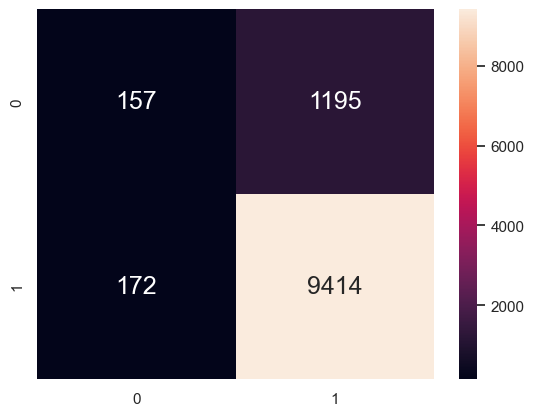

              precision    recall  f1-score   support

         0.0       0.48      0.12      0.19      1352
         1.0       0.89      0.98      0.93      9586

    accuracy                           0.88     10938
   macro avg       0.68      0.55      0.56     10938
weighted avg       0.84      0.88      0.84     10938



In [19]:
# Predict the Response corresponding to Predictors
y_pred = rforest.predict(X_test)

# Print the Classification Accuracy
print("test Data")
print("Accuracy  :\t", rforest.score(X_test, y_test))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmtest = confusion_matrix(y_test, y_pred)
tptest = cmtest[1][1] # True Positives : Good (1) predicted Good (1)
fptest = cmtest[0][1] # False Positives : Bad (0) predicted Good (1)
tntest = cmtest[0][0] # True Negatives : Bad (0) predicted Bad (0)
fntest = cmtest[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR test :\t", (tptest/(tptest + fntest)))
print("TNR test :\t", (tntest/(tntest + fptest)))
print()

print("FPR test :\t", (fptest/(tntest + fptest)))
print("FNR test :\t", (fntest/(tptest + fntest)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for test data and predictions
print(classification_report(y_test, y_pred))

#### Version 2: With Upscaling

In [20]:
# Create the Random Forest object
rforest = RandomForestClassifier(n_estimators = 100,  # n_estimators denote number of trees
                                 max_depth = None)       # set the maximum depth of each tree

# Fit Random Forest on Train Data
rforest.fit(X1_train, y1_train.STATUS.ravel())

RandomForestClassifier()

Train Data
Accuracy  :	 0.7107495201107094

TPR Train :	 0.6763723787899025
TNR Train :	 0.7453113110424779

FPR Train :	 0.25468868895752206
FNR Train :	 0.3236276212100975


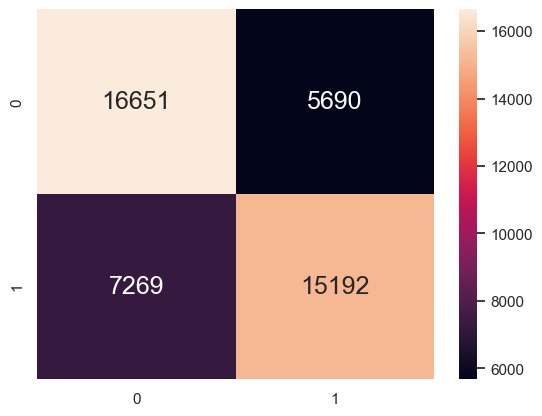

              precision    recall  f1-score   support

         0.0       0.70      0.75      0.72     22341
         1.0       0.73      0.68      0.70     22461

    accuracy                           0.71     44802
   macro avg       0.71      0.71      0.71     44802
weighted avg       0.71      0.71      0.71     44802



In [21]:
# Predict the Response corresponding to Predictors
y1_train_pred = rforest.predict(X1_train)

# Print the Classification Accuracy
print("Train Data")
print("Accuracy  :\t", rforest.score(X1_train, y1_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y1_train, y1_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y1_train, y1_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for train data and predictions
print(classification_report(y1_train, y1_train_pred))

test Data
Accuracy  :	 0.6859181335277575

TPR test :	 0.6499318729692904
TNR test :	 0.7214574060656247

FPR test :	 0.2785425939343753
FNR test :	 0.35006812703070955


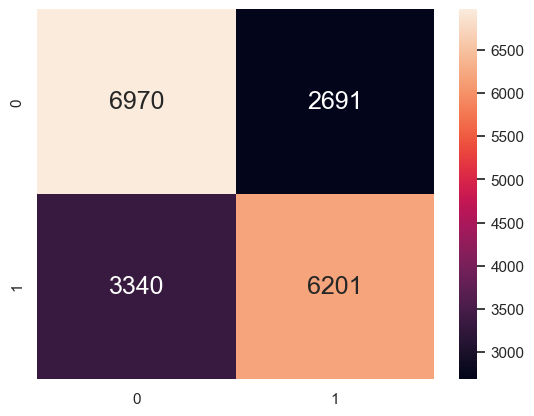

              precision    recall  f1-score   support

         0.0       0.68      0.72      0.70      9661
         1.0       0.70      0.65      0.67      9541

    accuracy                           0.69     19202
   macro avg       0.69      0.69      0.69     19202
weighted avg       0.69      0.69      0.69     19202



In [22]:
# Predict the Response corresponding to Predictors
y1_pred = rforest.predict(X1_test)

# Print the Classification Accuracy
print("test Data")
print("Accuracy  :\t", rforest.score(X1_test, y1_test))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmtest = confusion_matrix(y1_test, y1_pred)
tptest = cmtest[1][1] # True Positives : Good (1) predicted Good (1)
fptest = cmtest[0][1] # False Positives : Bad (0) predicted Good (1)
tntest = cmtest[0][0] # True Negatives : Bad (0) predicted Bad (0)
fntest = cmtest[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR test :\t", (tptest/(tptest + fntest)))
print("TNR test :\t", (tntest/(tntest + fptest)))
print()

print("FPR test :\t", (fptest/(tntest + fptest)))
print("FNR test :\t", (fntest/(tptest + fntest)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y1_test, y1_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for test data and predictions
print(classification_report(y1_test, y1_pred))

### GridSearchCV

In [23]:
# Define the Hyper-parameter Grid to search on, in case of Random Forest
param_grid = {'n_estimators': np.arange(100,501,100)}   # number of trees  

# Create the Hyper-parameter Grid
hpGrid = GridSearchCV(RandomForestClassifier(),   # the model family
                      param_grid,                 # the search grid
                      cv = 5,                     # 5-fold cross-validation
                      scoring = 'balanced_accuracy')       # score to evaluate

# Train the models using Cross-Validation
hpGrid.fit(X_train, y_train.STATUS.ravel())

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'n_estimators': array([100, 200, 300, 400, 500])},
             scoring='balanced_accuracy')

In [24]:
# Fetch the best Model or the best set of Hyper-parameters
print(hpGrid.best_estimator_)

# Print the score (accuracy) of the best Model after CV
print(np.abs(hpGrid.best_score_))

RandomForestClassifier(n_estimators=500)
0.5401968531432331


In [25]:
# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = split(X, y, test_size = 0.3)

# Import RandomForestClassifier model from Scikit-Learn
from sklearn.ensemble import RandomForestClassifier

# Create the Random Forest object
rforest = RandomForestClassifier(n_estimators = 500,   # found using GridSearchCV
                                 max_depth = None)       # found using GridSearchCV

# Fit Random Forest on Train Data
rforest.fit(X_train, y_train.STATUS.ravel())

RandomForestClassifier(n_estimators=500)

Train Data
Accuracy  :	 0.8912966809044242

TPR Train :	 0.9918514560512958
TNR Train :	 0.15354459327017314

FPR Train :	 0.8464554067298269
FNR Train :	 0.008148543948704248


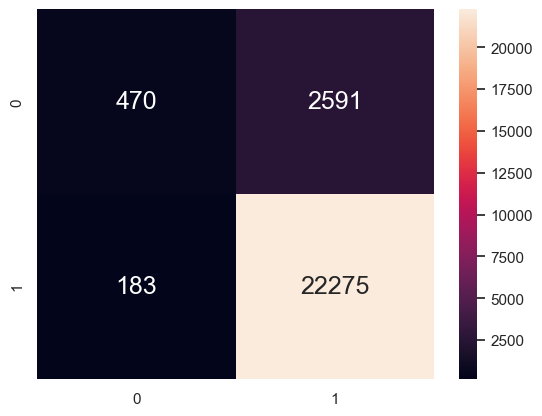

              precision    recall  f1-score   support

         0.0       0.72      0.15      0.25      3061
         1.0       0.90      0.99      0.94     22458

    accuracy                           0.89     25519
   macro avg       0.81      0.57      0.60     25519
weighted avg       0.87      0.89      0.86     25519



In [29]:
# Predict the Response corresponding to Predictors
y_train_pred = rforest.predict(X_train)

# Print the Classification Accuracy
print("Train Data")
print("Accuracy  :\t", rforest.score(X_train, y_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y_train, y_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for train data and predictions
print(classification_report(y_train, y_train_pred))

test Data
Accuracy  :	 0.8732857926494789

TPR test :	 0.6499318729692904
TNR test :	 0.7214574060656247

FPR test :	 0.2785425939343753
FNR test :	 0.35006812703070955


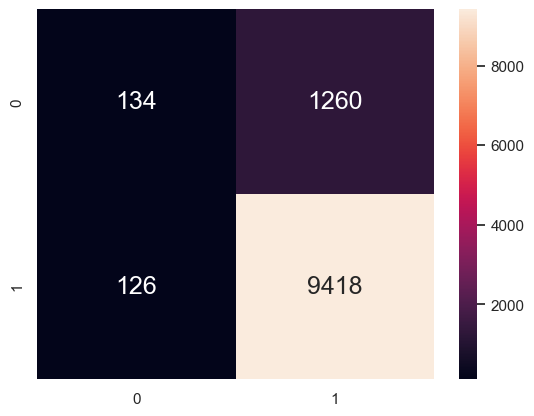

              precision    recall  f1-score   support

         0.0       0.68      0.72      0.70      9661
         1.0       0.70      0.65      0.67      9541

    accuracy                           0.69     19202
   macro avg       0.69      0.69      0.69     19202
weighted avg       0.69      0.69      0.69     19202



In [28]:
# Predict the Response corresponding to Predictors
y_pred = rforest.predict(X_test)

# Print the Classification Accuracy
print("test Data")
print("Accuracy  :\t", rforest.score(X_test, y_test))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmtest = confusion_matrix(y1_test, y1_pred)
tptest = cmtest[1][1] # True Positives : Good (1) predicted Good (1)
fptest = cmtest[0][1] # False Positives : Bad (0) predicted Good (1)
tntest = cmtest[0][0] # True Negatives : Bad (0) predicted Bad (0)
fntest = cmtest[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR test :\t", (tptest/(tptest + fntest)))
print("TNR test :\t", (tntest/(tntest + fptest)))
print()

print("FPR test :\t", (fptest/(tntest + fptest)))
print("FNR test :\t", (fntest/(tptest + fntest)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for test data and predictions
print(classification_report(y1_test, y1_pred))

### In Conclusion

Overall, through this process we have come to the conclusion that Total Income is the variable that affects a person's ability to pay off loans the most. 

From the outputs, we could see how upscaling improved the performance of both the Decision Tree and the Random Forest, as well as how Random Forest is more accurate than Decision Tree. We could also see how coupling Random Forest with GridSearchCV lead to its optimal performance, with the accuracy increasing to 87% from the initial 68%.